##Resize
Resize modifies the size of an input image to specific dimensions or reduces its size for easier storage or transmission.

**What is the minimum and maximum size that we can resize images into?**

Usually it depends on several factors such as the size and aspect ratio of the original image, the amount of detail present in the image, and the desired output size.

As a general guideline, it is usually safe to resize an image to no less than 32x32 pixels, as smaller sizes can lead to loss of important details and features. On the other hand, the maximum safe size can vary depending on the available hardware resources and processing power. In most cases, it is recommended to keep the aspect ratio of the original image to avoid stretching or squishing the image

*options inspired from roboflow.com*

In [1]:
#import required libraries
from google.colab import files
from PIL import Image, ImageOps
import numpy as np

In [2]:
#upload an image in google colab
uploaded_file = files.upload()

Saving ball_3.JPG to ball_3.JPG


size of an image: [1620 1080]


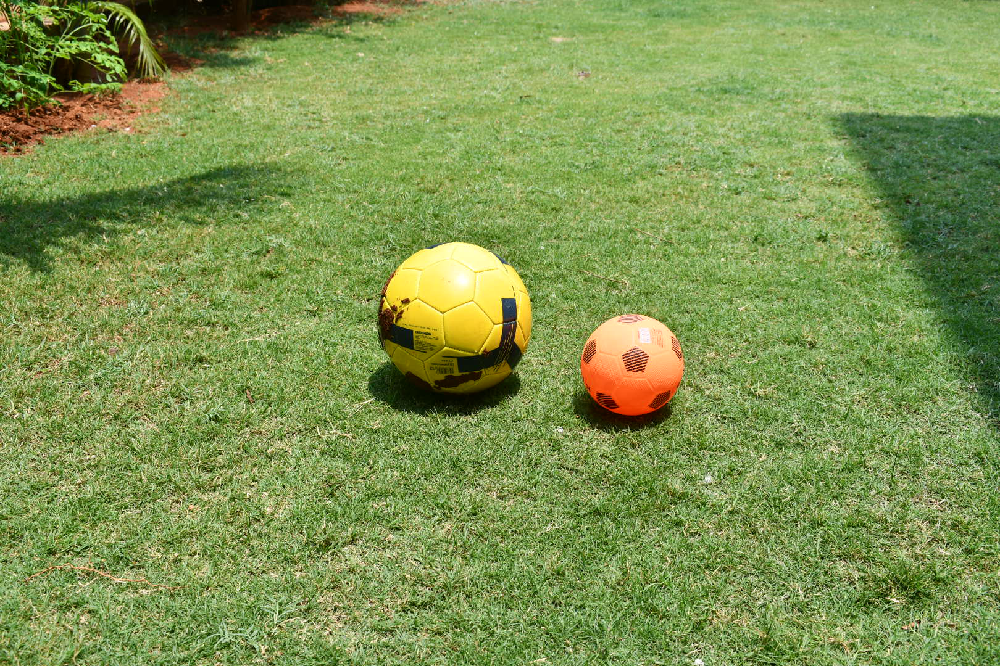

In [3]:
#open and view the image
original_image = Image.open("ball_3.JPG")
print("size of an image:", np.array(original_image.size))
original_image.show()

**1. Stretch to:** adjust the dimensions of an image to a specific size in pixels but they don’t maintain the aspect ratio of the original image. This results in square-shaped images that may appear distorted, but without any loss of source image data.

size of an input image: [1620 1080]
original image aspect ratio: 1.5
resized image aspect ratio: 1.0


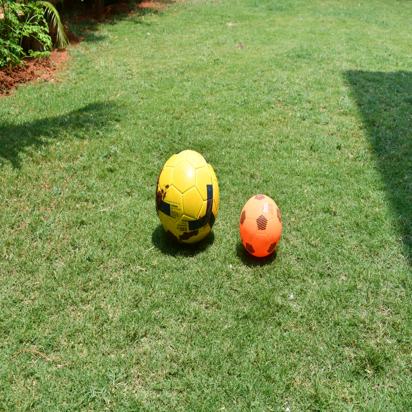

In [5]:

def stretch_to(image):
  preferred_size = (412, 412)
  resized_image = image.resize(preferred_size)
  return resized_image

resized_image = stretch_to(original_image)


#check the aspect ratios
original_size = np.array(original_image.size)
output_size = np.array(resized_image.size)
print("size of an input image:", original_size)
original_aspect_ratio = original_size[0] / original_size[1]
output_aspect_ratio = output_size[0] / output_size[1]
print("original image aspect ratio:", original_aspect_ratio)
print("resized image aspect ratio:", output_aspect_ratio)

resized_image.show()

**2. Fill (with center crop) in:** Fill (with center crop) in: The resulting image will be a centered crop of your desired output dimensions. This means that if the source image is, for instance, 1620x1080 and the resize option is set to 512x512, the output image will be a 512x512 crop of the center of the source image. In this case, the aspect ratio is also not maintained,and some of the source image data will be lost in the process.






original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [512 512]
resized image aspect ratio: 1.0


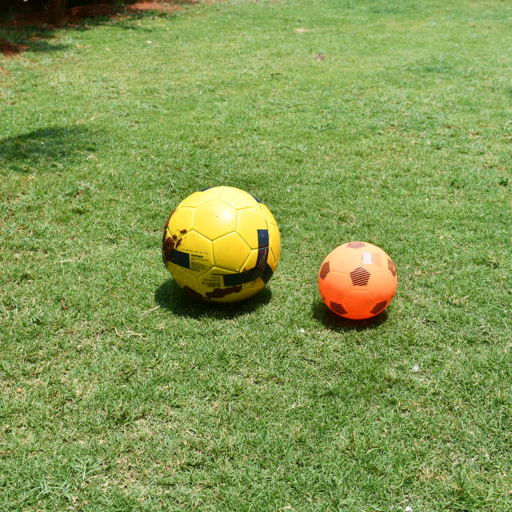

In [10]:

def fill_center_crop(image, output_size):
    """
    Resize and center crop an image to the desired output size.
    """
    # Get the original image size
    original_size = np.array(image.size)
    print("original size of an image:", original_size)
    
    # Calculate the aspect ratios of the original and output sizes
    original_aspect_ratio = original_size[0] / original_size[1]
    print("original image aspect ratio:", original_aspect_ratio)
    output_aspect_ratio = output_size[0] / output_size[1]
    
        
    # Determine which dimension needs to be cropped
    if original_aspect_ratio > output_aspect_ratio:
        # The image is wider than the output, so crop the sides
        new_width = int(original_size[1] * output_aspect_ratio)
        left = int((original_size[0] - new_width) / 2)
        right = int((original_size[0] + new_width) / 2)
        image = image.crop((left, 0, right, original_size[1]))
    else:
        # The image is taller than the output, so crop the top and bottom
        new_height = int(original_size[0] / output_aspect_ratio)
        top = int((original_size[1] - new_height) / 2)
        bottom = int((original_size[1] + new_height) / 2)
        image = image.crop((0, top, original_size[0], bottom))
    
    # Resize the cropped image to the desired output size
    image = image.resize(output_size)
    resized_image = np.array(image.size)
    print("size of a resized image:", resized_image)
    resized_aspect_ratio = resized_image[0] / resized_image[1]
    print("resized image aspect ratio:", resized_aspect_ratio)
    return image

output_size = (512, 512)
filled_center_image = fill_center_crop(original_image, output_size)
#filled_image.save("filled_image.jpg")
filled_center_image.show()

**3.Fit within:** The dimensions of the source dimension are scaled to be the dimensions of the output image while maintaining the source image aspect ratio. For example, if a source image is 1620x1080 and the resize option is set to 512x512, the longer dimensions (1620) is scaled to 512 and the secondary dimension (1080) is scaled to ~341 pixels. Image aspect ratios and original data are maintained, but they are not square.

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [512 341]
resized image aspect ratio: 1.501466275659824


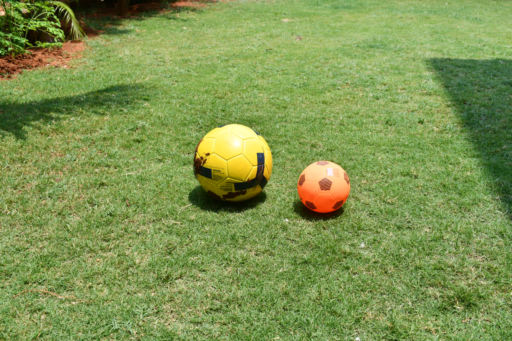

In [12]:

def fit_within(image, output_size):
    """
    Resize an image to fit within the desired output size while maintaining the aspect ratio.
    """
    # Get the original image size
    original_size = np.array(image.size)
    print("original size of an image:", original_size)
    
    # Calculate the aspect ratios of the original and output sizes
    original_aspect_ratio = original_size[0] / original_size[1]
    print("original image aspect ratio:", original_aspect_ratio)
    output_aspect_ratio = output_size[0] / output_size[1]

    # Determine which dimension needs to be scaled
    if original_aspect_ratio > output_aspect_ratio:
        # The image is wider than the output, so scale the width
        new_width = output_size[0]
        new_height = int(new_width / original_aspect_ratio)
    else:
        # The image is taller than the output, so scale the height
        new_height = output_size[1]
        new_width = int(new_height * original_aspect_ratio)
    # Resize the image to fit within the desired output size
    image = image.resize((new_width, new_height), resample=Image.BILINEAR)

    resized_image = np.array(image.size)
    print("size of a resized image:", resized_image)
    resized_aspect_ratio = resized_image[0] / resized_image[1]
    print("resized image aspect ratio:", resized_aspect_ratio)
    return image


output_size = (512, 512)
filled_within_image = fit_within(original_image, output_size)
filled_within_image.show() 

**5.Fit (black edges) in:** The dimensions of the source dimension are scaled to be the dimensions of the output image while maintaining the source image aspect ratio, and any newly created padding is black area. For example, if a source image is 1620x1080 and the resize option is set to 512x512, the longer dimensions (1620) is scaled to 512 and the secondary dimension (1080) is scaled to ~341.48 pixels. The remaining pixel area (512-341, or 171 pixels) are black pixels. Images are square, black padded, and aspect ratios plus original data are maintained.

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [512 341]
resized image aspect ratio: 1.501466275659824
size of a padded image: [512 512]


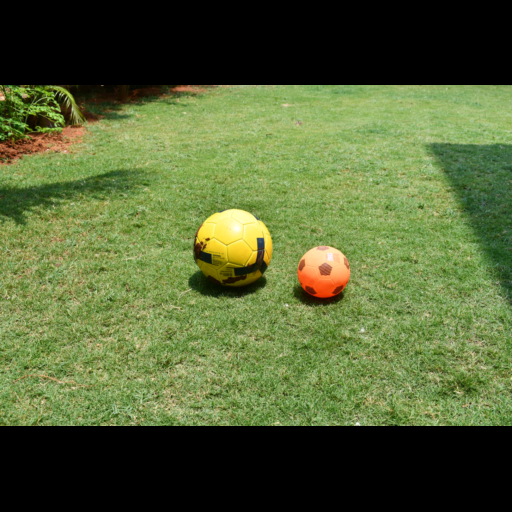

In [17]:
def resize_fit_black(image, output_size):
    """
    Resize the input image using "Fit (black edges) in" method.
    """
    # Get the original image size
    original_size = np.array(image.size)
    print("original size of an image:", original_size)
    
    # Calculate the aspect ratios of the original and output sizes
    original_aspect_ratio = original_size[0] / original_size[1]
    print("original image aspect ratio:", original_aspect_ratio)
    output_aspect_ratio = output_size[0] / output_size[1]

    # Determine which dimension needs to be scaled
    if original_aspect_ratio > output_aspect_ratio:
      # The image is wider than the output, so scale the width
      new_width = output_size[0]
      new_height = int(new_width / original_aspect_ratio)
    else:
      # The image is taller than the output, so scale the height
      new_height = output_size[1]
      new_width = int(new_height * original_aspect_ratio)

    # Resize the image to fit within the desired output size
    image = image.resize((new_width, new_height), resample=Image.BILINEAR)

    black = (0, 0, 0)  # Black color

    padded_black = ImageOps.pad(image, (output_size[0], output_size[1]), color=black)

    resized_image = np.array(image.size)
    print("size of a resized image:", resized_image)
    resized_aspect_ratio = resized_image[0] / resized_image[1]
    print("resized image aspect ratio:", resized_aspect_ratio)

    padded_image = np.array(padded_black.size)
    print("size of a padded image:", padded_image)
    
    return padded_black

filled_black = resize_fit_black(original_image, (512, 512))
filled_black.show()


**6.Fit (white edges) in:** The dimensions of the source dimension are scaled to be the dimensions of the output image while maintaining the source image aspect ratio, and any newly created padding is black area. For example, if a source image is 1620x1080 and the resize option is set to 512x512, the longer dimensions (1620) is scaled to 512 and the secondary dimension (1080) is scaled to ~341.48 pixels. The remaining pixel area (512-341, or 171 pixels) are white pixels. Images are square, black padded, and aspect ratios plus original data are maintained..

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [512 341]
resized image aspect ratio: 1.501466275659824
size of a padded image: [512 512]


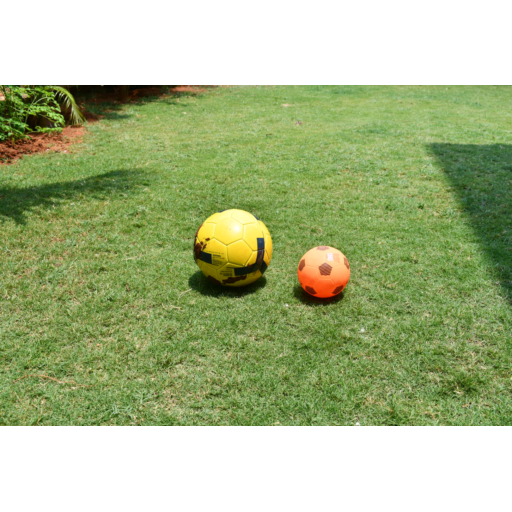

In [18]:

def resize_fit_white(image, output_size):
    """
    Resize the input image using "Fit (white edges) in" method.
    """
# Get the original image size
    original_size = np.array(image.size)
    print("original size of an image:", original_size)
    
    # Calculate the aspect ratios of the original and output sizes
    original_aspect_ratio = original_size[0] / original_size[1]
    print("original image aspect ratio:", original_aspect_ratio)
    output_aspect_ratio = output_size[0] / output_size[1]

    # Determine which dimension needs to be scaled
    if original_aspect_ratio > output_aspect_ratio:
      # The image is wider than the output, so scale the width
      new_width = output_size[0]
      new_height = int(new_width / original_aspect_ratio)
    else:
      # The image is taller than the output, so scale the height
      new_height = output_size[1]
      new_width = int(new_height * original_aspect_ratio)

    # Resize the image to fit within the desired output size
    image = image.resize((new_width, new_height), resample=Image.BILINEAR)

    white = (255, 255, 255)  # white color

    padded_white = ImageOps.pad(image, (output_size[0], output_size[1]), color=white)

    resized_image = np.array(image.size)
    print("size of a resized image:", resized_image)
    resized_aspect_ratio = resized_image[0] / resized_image[1]
    print("resized image aspect ratio:", resized_aspect_ratio)

    padded_image = np.array(padded_white.size)
    print("size of a padded image:", padded_image)
    
    return padded_white
    
filled_white = resize_fit_white(original_image, (512, 512))
filled_white.show()

In [20]:
def resize_image(image, output_size, method='fit_within'):
    
    # Apply the desired resizing method
    if method == 'stretch':
        resized_image = image.resize(output_size)
    elif method == 'filled_center':
        resized_image = fill_center_crop(image, output_size)
    elif method == 'fit_within':
        resized_image = fit_within(image, output_size)
    #elif method == 'fit_reflect':
    #    resized_image = fit_reflect_resize(image, output_size)
    elif method == 'fit_black':
        resized_image = fit_within(image, output_size)
        black = (0, 0, 0)  # Black color
        resized_image = ImageOps.pad(resized_image, (output_size[0], output_size[1]), color=black)
    elif method == 'fit_white':
        resized_image = fit_within(image, output_size)
        white = (255, 255, 255)  # white color
        resized_image = ImageOps.pad(resized_image, (output_size[0], output_size[1]), color=white)
    else:
        raise ValueError(f"Invalid resizing method '{method}'")
    
    return resized_image

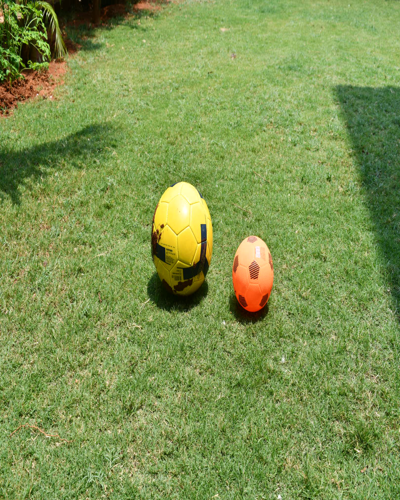

In [21]:
resized_image = resize_image(original_image, (400,500), method='stretch')
resized_image.show()

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [400 500]
resized image aspect ratio: 0.8


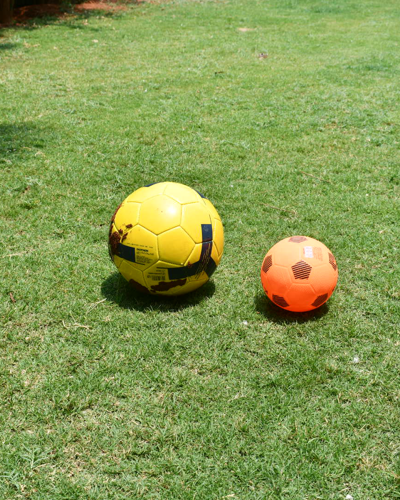

In [23]:
resized_image =resize_image(original_image, (400,500), method='filled_center')
resized_image.show()

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [400 266]
resized image aspect ratio: 1.5037593984962405


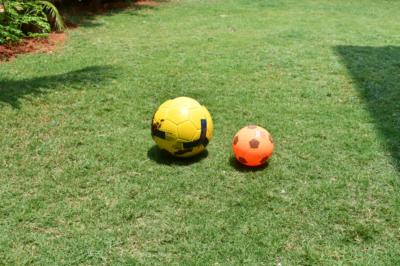

In [24]:
resized_image =resize_image(original_image, (400,500), method='fit_within')
resized_image.show()

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [400 266]
resized image aspect ratio: 1.5037593984962405


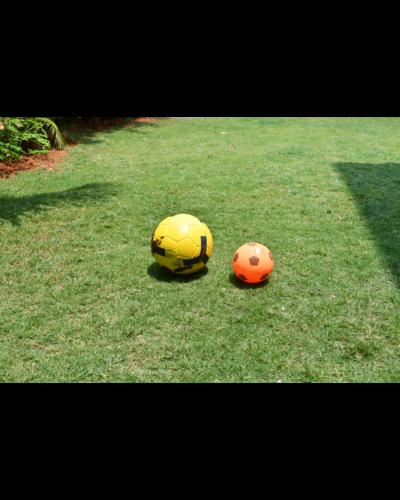

In [25]:
resized_image =resize_image(original_image, (400,500), method='fit_black')
resized_image.show()

original size of an image: [1620 1080]
original image aspect ratio: 1.5
size of a resized image: [400 266]
resized image aspect ratio: 1.5037593984962405


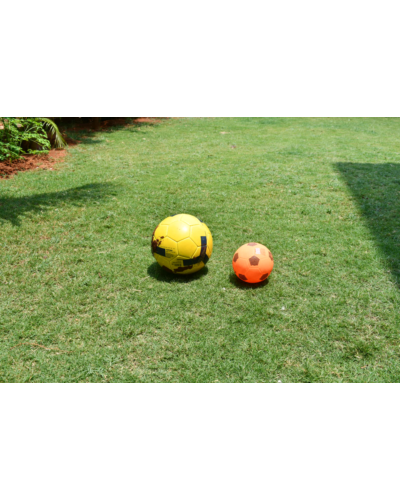

In [26]:
resized_image =resize_image(original_image, (400,500), method='fit_white')
resized_image.show()

**Resize when to use what?**

**Stretch to:**  is a simple resize function image.resize(preferred_size)
This method can resize the image to a specified size, but they do not take into account the aspect ratio of the original image or the dimensions of the display area. As a result, the resized image may be stretched or distorted if it does not match the aspect ratio of the display area.

**Fill (with center crop) in:** The generated image is a centered crop of your desired output dimensions. 
center cropping is used when we want to resize an image while maintaining its aspect ratio, but also ensure that the most informative parts of the image are included in the final output.

**Fit within:** This type of resizing is commonly used when we want to resize an image to fit within a certain size while maintaining the original aspect ratio of the image. We often use this in scenarios where we want to display an image in a user interface or on a web page, where we want to limit the size of the image to fit within a certain space while still preserving the original aspect ratio. This ensures that the image is not distorted and looks visually appealing.

For example, a website may have a gallery of images that need to be displayed within a fixed area on the page. If the images are of different sizes and aspect ratios, we can use the "Fit within" method to resize them


**Fill (with center crop)  vs Fit within:**

The choice between "Fit within" and "Fill (with center crop)" resizing methods depends on the specific use case and the desired outcome.

"Fit within" is used when we want to resize an image to fit within a specific display area while maintaining its aspect ratio. This method ensures that the entire image is visible within the display area, with no cropping or loss of information. This is useful when we want to display the image in a user interface or on a web page, where we want the image to fit within a specific area without being distorted.

On the other hand, "Fill (with center crop)" is used when we want to resize an image to a fixed size while maintaining its aspect ratio, but we also want to focus on a specific part of the image. This method involves cropping the image to a fixed size while ensuring that the most important part of the image is included in the crop. This is useful in computer vision tasks such as object detection, where the model may require input images to be of a fixed size, and the most informative part of the image must be included in the input.

So, in summary, "Fit within" is useful when we want to display an image within a specific area without distortion, while "Fill (with center crop)" is useful when we want to resize an image to a fixed size while focusing on a specific part of the image.

**Fit (reflect edges) in vs Fit (black edges) in vs Fit (white edges)**

The "Fit (reflect edges) in", "Fit (black edges) in", and "Fit (white edges) in" are different variations of the "Fit within" method, where the pixels outside the original image are filled with a specific color or reflection of the image edges.

These variations are useful in scenarios where we want the resized image to fit within a specific area but also want to control the appearance of the pixels outside the original image.

Fit (reflect edges) in: In this method, the pixels outside the original image are filled with a reflection of the original image. This is useful when we want the resized image to seamlessly blend with the surrounding area without abrupt edges.

Fit (black edges) in: In this method, the pixels outside the original image are filled with black color. This is useful when we want to create a clean, sharp boundary between the image and the surrounding area.

Fit (white edges) in: In this method, the pixels outside the original image are filled with white color. This is useful when we want to create a softer boundary between the image and the surrounding area, and want to maintain a consistent color scheme.

Overall, the choice between these variations depends on the specific use case and the desired outcome. For example, if we want to display an image on a web page with a dark background, we may choose the "Fit (black edges) in" method to create a sharp boundary between the image and the background. Similarly, if we want to create a gallery of images with a consistent color scheme, we may choose the "Fit (white edges) in" method to maintain a consistent look and feel.

**What is the ideal recommended re-size for computer vision models?**

The recommended size for computer vision models depends on the specific model architecture and task at hand. In general, the input size of the image should be large enough to capture important details of the object or scene, but not too large that it slows down the model training or inference time.

Some popular computer vision models, such as ResNet and VGG, use input image sizes of 224x224 or 256x256. Other models, such as EfficientNet and ViT, can use larger input sizes of 384x384 or 512x512 for better performance. However, using larger input sizes may also require more powerful hardware and longer training times.

It's also important to consider the aspect ratio of the input images, especially if the images are captured from different devices or sources. In such cases, it's often useful to resize the images to a fixed aspect ratio, such as 1:1 or 4:3, before feeding them into the model.

Overall, the choice of input image size should be based on the specific requirements of the task, the available hardware resources, and the performance trade-offs. It's often recommended to experiment with different input sizes and evaluate the model performance to determine the optimal input size for a given task.
